# AI Project Group 10
#Baseline

This is the Baseline model. \\
It uses Resnet architecture + KNN. \\
At the end, we query the 10 given faces and generate 20 similar images for each face.\\
To see the improvement, go to the improvement ipynb collab notebook.

In [24]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [2]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from tensorflow import keras
from keras.utils import np_utils#, to_categorical
from keras.models import Model, Sequential, load_model
from keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Reshape, Dropout
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.vgg16 import VGG16
from sklearn.model_selection import train_test_split
from keras.applications.resnet_v2 import ResNet50V2
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
import cv2, os, itertools
from tqdm import tqdm
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
from shutil import copyfile
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

In [3]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [4]:
task = 'resnetKNN'

In [5]:
homeDir = '/content/drive/MyDrive'
projDir = os.path.join(homeDir, 'AI_Project')
taskDir = os.path.join(projDir, task)
taskModelDir = os.path.join(taskDir, 'model')
taskDataDir = os.path.join(taskDir, 'data')

In [6]:
if not os.path.exists(projDir):
  os.makedirs(projDir)

if not os.path.exists(taskDir):
  os.makedirs(taskDir)

if not os.path.exists(taskModelDir):
  os.makedirs(taskModelDir)  

if not os.path.exists(taskDataDir):
  os.makedirs(taskDataDir)    

In [7]:
#remove existing folder if any
lfwDir = os.path.join(projDir, 'lfw-deepfunneled')
!rm -rf $lfwDir

#Download, unzip and move the lfw folder to the project directory
!wget http://vis-www.cs.umass.edu/lfw/lfw-deepfunneled.tgz
!tar -xzvf lfw-deepfunneled.tgz
!mv lfw-deepfunneled $projDir
!rm -rf lfw-deepfunneled.tgz

Streaming output truncated to the last 5000 lines.
lfw-deepfunneled/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0012.jpg
lfw-deepfunneled/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0013.jpg
lfw-deepfunneled/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0014.jpg
lfw-deepfunneled/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0015.jpg
lfw-deepfunneled/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0016.jpg
lfw-deepfunneled/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0017.jpg
lfw-deepfunneled/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0018.jpg
lfw-deepfunneled/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0019.jpg
lfw-deepfunneled/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0020.jpg
lfw-deepfunneled/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0021.jpg
lfw-deepfunneled/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0022.jpg
lfw-deepfunneled/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0023.jpg
lfw-deepfunne

In [16]:
#Split the lfw folder into test train and validation set
def img_train_test_split(img_source_dir, train_size):
    """
    Randomly splits images over a train and validation folder, while preserving the folder structure
    
    Parameters
    ----------
    img_source_dir : string
        Path to the folder with the images to be split. Can be absolute or relative path   
        
    train_size : float
        Proportion of the original images that need to be copied in the subdirectory in the train folder
    """    
    if not (isinstance(img_source_dir, str)):
        raise AttributeError('img_source_dir must be a string')
        
    if not os.path.exists(img_source_dir):
        raise OSError('img_source_dir does not exist')
        
    if not (isinstance(train_size, float)):
        raise AttributeError('train_size must be a float')
        
    # Set up empty folder structure if not exists
    if os.path.exists(os.path.join(taskDataDir, '')):
    
        if not os.path.exists(os.path.join(taskDataDir, 'train')):
            os.makedirs(os.path.join(taskDataDir, 'train'))
        if not os.path.exists(os.path.join(taskDataDir, 'validation')):
            os.makedirs(os.path.join(taskDataDir, 'validation'))
            
    # Get the subdirectories in the main image folder
    subdirs = [subdir for subdir in os.listdir(img_source_dir) if os.path.isdir(os.path.join(img_source_dir, subdir))]

    for subdir in subdirs:
        subdir_fullpath = os.path.join(img_source_dir, subdir)
        if len(os.listdir(subdir_fullpath)) == 0:
            print(subdir_fullpath + ' is empty')
            break

        train_subdir = os.path.join(os.path.join(taskDataDir, 'train'), subdir)
        validation_subdir = os.path.join(os.path.join(taskDataDir, 'validation'), subdir)

        # Create subdirectories in train and validation folders
        if not os.path.exists(train_subdir):
            os.makedirs(train_subdir)

        if not os.path.exists(validation_subdir):
            os.makedirs(validation_subdir)


        train_counter = 0
        validation_counter = 0
        test_counter = 0

        # Randomly assign an image to train, validation or test folders
        for filename in os.listdir(subdir_fullpath):
            if filename.endswith(".jpg") or filename.endswith(".png"): 
                fileparts = filename.split('.')

                choice = random.uniform(0, 1)

                #Assign to Train
                if choice <= train_size:
                    copyfile(os.path.join(subdir_fullpath, filename), os.path.join(train_subdir, str(train_counter) + '.' + fileparts[1]))
                    train_counter += 1
                #Assign to Validation    
                else:
                    copyfile(os.path.join(subdir_fullpath, filename), os.path.join(validation_subdir, str(validation_counter) + '.' + fileparts[1]))
                    validation_counter += 1    
  
                    
        print('Copied ' + str(train_counter) + ' images to data/train/' + subdir)
        print('Copied ' + str(validation_counter) + ' images to data/validation/' + subdir)

In [17]:
train_subdir = os.path.join(taskDataDir, 'train')
print(train_subdir)

/content/drive/MyDrive/AI_Project/resnetKNN/data/train


In [26]:
imageDir = '/content/drive/MyDrive/AI_Project/lfw-deepfunneled'

In [27]:
#This cell can be skipped if you already have access to h5 and pickle files
#Run from the next cell onwards
img_train_test_split(imageDir, train_size=0.8)

Streaming output truncated to the last 5000 lines.
Copied 0 images to data/train/Mohammad_Mustapha_Miro
Copied 1 images to data/validation/Mohammad_Mustapha_Miro
Copied 1 images to data/train/Mohammaed_Ahmad_Al_Jarallah
Copied 0 images to data/validation/Mohammaed_Ahmad_Al_Jarallah
Copied 1 images to data/train/Mohammed_Abu_Sharia
Copied 0 images to data/validation/Mohammed_Abu_Sharia
Copied 1 images to data/train/Mohammed_Abulhasan
Copied 0 images to data/validation/Mohammed_Abulhasan
Copied 12 images to data/train/Mohammed_Al-Douri
Copied 3 images to data/validation/Mohammed_Al-Douri
Copied 1 images to data/train/Mohammed_Al_Hindi
Copied 0 images to data/validation/Mohammed_Al_Hindi
Copied 1 images to data/train/Mohammed_Ashraf_Hafiz
Copied 0 images to data/validation/Mohammed_Ashraf_Hafiz
Copied 3 images to data/train/Mohammed_Baqir_al-Hakim
Copied 0 images to data/validation/Mohammed_Baqir_al-Hakim
Copied 1 images to data/train/Mohammed_Dahlan
Copied 0 images to data/validation/Moh

# Get LFW Data Generators

In [11]:
# Directories
train_directory = os.path.join(taskDataDir, 'train')
valid_directory = os.path.join(taskDataDir, 'validation')


# Constants
img_rows = 224
img_cols = 224
input_shape = (img_rows,img_cols,3)

In [ ]:
epochs = 10
batch_size = 64
num_of_classes = 5749


# Load Train Data as image generator with Keras, Normalization with (rescale=1./255)
train_generator = ImageDataGenerator(rescale=1./255).flow_from_directory(directory=train_directory, 
                                                                         class_mode='categorical', 
                                                                         batch_size=batch_size,
                                                                         target_size=(img_rows, img_cols),
                                                                         color_mode="rgb",
                                                                         shuffle=True)

# Load Validation Data as image generator with Keras, Normalization with (rescale=1./255)
valid_generator = ImageDataGenerator(rescale=1./255).flow_from_directory(directory=valid_directory, 
                                                                         class_mode='categorical', 
                                                                         batch_size=batch_size,
                                                                         target_size=(img_rows, img_cols),
                                                                         color_mode="rgb",
                                                                         shuffle=True)


Found 10772 images belonging to 5749 classes.
Found 2658 images belonging to 5749 classes.


In [ ]:
# Function for plotting the Confusion Matrix
def plotConfusionMatrix(cm, class_names, normalize=True, title='Confusion matrix', cmap=plt.cm.Blues):
  plt.figure(figsize=(10,10))
  plt.imshow(cm, interpolation='nearest', cmap=cmap)
  plt.title(title)
  plt.colorbar()

  tick_marks = np.arange(len(class_names))
  plt.xticks(tick_marks, class_names, rotation=45)
  plt.yticks(tick_marks, class_names)

  if normalize:
      cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
      cm = np.around(cm, decimals=2)
      cm[np.isnan(cm)] = 0.0
      print("Normalized confusion matrix")

  else:
      print('Confusion matrix, without normalization')

  thresh = cm.max() / 2.
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
      plt.text(j, i, cm[i, j],
                horizontalalignment="center",
                color="white" if cm[i, j] > thresh else "black")

  plt.tight_layout()
  plt.ylabel('True label')
  plt.xlabel('Predicted label')
  plt.show()

In [ ]:
# Function for train the given model and get Confusion Matrix
def trainModelAndGetConfusionMatrix(model):
  
  #Set Early stopping criteria
  callback = keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=1e-3, mode='max', patience=3, restore_best_weights=True)
  

  # Fit the model
  model.fit_generator(train_generator,
                      epochs=epochs,
                      steps_per_epoch=len(train_generator.classes)//batch_size,#num_of_train_samples // batch_size,
                      validation_data=valid_generator,
                      validation_steps=len(valid_generator.classes) // batch_size,
                      callbacks=[callback])#num_of_valid_samples // batch_size)

 
  class_names = []
  for key in train_generator.class_indices:
      class_names.append(key)


  return model

In [9]:
# Get ResNet-50 Model
def getResNet50Model(lastFourTrainable=False):
  resnet_model = ResNet50V2(weights='imagenet', input_shape=input_shape, include_top=True)

  # Make all layers non-trainable
  for layer in resnet_model.layers[:]:
      layer.trainable = False

  # Add fully connected layer which have 1024 neuron to ResNet-50 model
  output = resnet_model.get_layer('avg_pool').output
  output = Flatten(name='new_flatten')(output)
  output = Dense(units=8192, activation='relu', name='new_fc')(output)
  output = Dense(units=5749, activation='softmax')(output)
  resnet_model = Model(resnet_model.input, output)

  # Make last 4 layers trainable if lastFourTrainable == True
  if lastFourTrainable == True:
    resnet_model.get_layer('conv5_block3_2_bn').trainable = True
    resnet_model.get_layer('conv5_block3_3_conv').trainable = True
    resnet_model.get_layer('post_bn').trainable = True
    resnet_model.get_layer('new_fc').trainable = True

  # Compile ResNet-50 model
  resnet_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
  resnet_model.summary()
  
  return resnet_model

In [ ]:
# Get ResNet-50 Model with lastFourTrainable=False
resnet_model_a = getResNet50Model(lastFourTrainable=True)
# Train ResNet-50 Model and get Confusion Matrix
resnet_model_a = trainModelAndGetConfusionMatrix(resnet_model_a)
resnet_model_a.save_weights('/content/drive/MyDrive/AI_Project/resnetKNN/model/model_resnet_trainable_full.h5')

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

In [50]:
# Get feature vector of an image by given model and img_path
def getFeatureVector(model, img_path):
  img = cv2.imread(img_path)
  img = cv2.resize(img, (224, 224))
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  feature_vector = model.predict(img.reshape(1, 224, 224, 3))

  print(img_path + " is added.")
  return feature_vector

# Get cosine similarity between feature vectors A and B using cosine similarity
def getCosineSimilarity(A, B):
  cos_similarity = np.dot(A,B.T) / (np.linalg.norm(A)*np.linalg.norm(B)) # Get cosine similarity
  return cos_similarity[0][0]

In [12]:
# Function for get dataframe which contains the output features of given model
def getFeatureDataFrame(model):
  df = pd.DataFrame(columns=['file', 'features'])
  train_files = train_generator.filepaths
  valid_files = valid_generator.filepaths

  files = train_files + valid_files
  print(len(files))

  df['file'] = files
  df['features'] = df.apply(lambda row: getFeatureVector(model, row['file']), axis=1) 
  
  data_encoded = []
  for filei in files:
    data_encoded.append(getFeatureVector(model, filei))

  print("All files added.")
  return df,data_encoded

In [47]:
resnet_model_a = getResNet50Model(lastFourTrainable=True)
resnet_model_a.load_weights('/content/drive/MyDrive/AI_Project/resnetKNN/model/model_resnet_trainable_full.h5')
feature_model_resnet_a = Model(inputs=resnet_model_a.input, outputs=resnet_model_a.get_layer('new_fc').output)

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

In [ ]:
#Checkpoint A
#Run this cell if you do not have the pickle file, then move to Checkpoint C and run from there onwards
#Else go to Checkpoint B
df, data_encoded = getFeatureDataFrame(feature_model_resnet_a)
df.to_pickle("/content/drive/MyDrive/AI_Project/resnetKNN/model/features_resnet_a.pickle")

In [28]:
#Checkpoint B
#If you already have the pickle file run the following code and continue
#Else skip and go to checkpoint C
df = pd.read_pickle('/content/drive/MyDrive/AI_Project/resnetKNN/model/features_resnet_a.pickle')

In [31]:
files = df['file']

In [32]:
data_encoded_temp = np.asarray(list(df['features']))
print(data_encoded_temp.shape)

(13430, 1, 8192)


In [33]:
data_encoded = data_encoded_temp.reshape((data_encoded_temp.shape[0],data_encoded_temp.shape[2]))
print(data_encoded.shape)

(13430, 8192)


In [ ]:
#Checkpoint C
df['features'][1].shape


(1, 8192)

In [34]:
# Plot similar 5 images with given image and similar images dataframe
def plotSimilarImages(img_file, similar_df, model_name):
  img = cv2.imread(img_file)
  img = cv2.resize(img, (224, 224))
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  split_list = img_file.split('/')
  split_list.reverse()
  img_class = split_list[1]
  fig, axarr = plt.subplots(2,3)
  axarr[0,0].imshow(img)
  axarr[0,0].set_title("TEST IMAGE - " + model_name + "\nClass: " + img_class)
  axarr[0,0].axis('off')

  j, k, m = 0, 0, 1
  for index, sim in similar_df.iterrows():
    filepath = sim['file']
    similarity = sim['similarity']
    split_list = filepath.split('/')
    split_list.reverse()
    sim_class = split_list[1]

    similar = cv2.imread(filepath)
    similar = cv2.resize(similar, (224, 224))
    similar = cv2.cvtColor(similar, cv2.COLOR_BGR2RGB)
    axarr[k,m].imshow(similar)
    axarr[k,m].set_title("Similarity: %.3f" % similarity + "\nClass: " + sim_class)
    axarr[k,m].axis('off')

    m += 1
    if m == 3 and k != 1:
      k += 1
      m = 0

    j += 1
    if j == 5:
      break

  plt.tight_layout()
  plt.show()

In [35]:
# Get and plot 5 similar images for given image path and features dataframe
def getSimilarImages(img_file, features_df, model, model_name):
  img_features = getFeatureVector(model, img_file)
  features_df['similarity'] = features_df.apply(lambda row: getCosineSimilarity(img_features, np.asarray(row['features'])), axis=1)  
  sorted_df = features_df.sort_values(by='similarity', ascending=False)
  
  plotSimilarImages(img_file, sorted_df.head(5), model_name)

KMeans

In [36]:
from sklearn.cluster import KMeans  

In [37]:
print(data_encoded.shape)

(13430, 8192)


In [38]:
K=[6]

kmeans = KMeans(n_clusters = K[0], random_state=0).fit(data_encoded)
labels=kmeans.labels_
centroids = kmeans.cluster_centers_

In [39]:
import joblib
kmeans_file = os.path.join(taskModelDir, 'kmeans_model.pkl')
joblib.dump(kmeans,kmeans_file)

['/content/drive/MyDrive/AI_Project/resnetKNN/model/kmeans_model.pkl']

In [40]:
#contains train and valid filepaths
lisp = files

print(len(lisp))

13430


In [41]:
clusters_features = []
cluster_files=[]
for i in [0,1,2,3,4,5]:
    i_cluster = []
    i_labels=[]
    for iter,j in enumerate(kmeans.labels_):
        if j==i:
            i_cluster.append(data_encoded[iter])
            i_labels.append(lisp[iter])
    i_cluster = np.array(i_cluster)
    clusters_features.append(i_cluster)
    cluster_files.append(i_labels)

In [42]:
labels=[]
data=[]
files=[]
for iter,i in enumerate(clusters_features):
    data.extend(i)
    labels.extend([iter for i in range(i.shape[0])])
    files.extend(cluster_files[iter])
print(np.array(labels).shape)
print(np.array(data).shape)
print(np.array(files).shape)

(13430,)
(13430, 8192)
(13430,)


KNN

In [43]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=9,algorithm='ball_tree',n_jobs=-1)
knn.fit(np.array(data),np.array(labels))

KNeighborsClassifier(algorithm='ball_tree', n_jobs=-1, n_neighbors=9)

In [44]:
knn_file = os.path.join(taskModelDir, 'knn_model.pkl')
joblib.dump(knn,knn_file)

['/content/drive/MyDrive/AI_Project/resnetKNN/model/knn_model.pkl']

In [45]:
def plot_(x,y1,y2,row,col,ind,title,xlabel,ylabel,label,isimage=False,color='b'):

    """
    This function is used for plotting images and graphs (Visualization of end results of model training)
    Arguments:
    x - (np.ndarray or list) - an image array
    y1 - (list) - for plotting graph on left side.
    y2 - (list) - for plotting graph on right side.
    row - (int) - row number of subplot 
    col - (int) - column number of subplot
    ind - (int) - index number of subplot
    title - (string) - title of the plot 
    xlabel - (list) - labels of x axis
    ylabel - (list) - labels of y axis
    label - (string) - for adding legend in the plot
    isimage - (boolean) - True in case of image else False
    color - (char) - color of the plot (prefered green for training and red for testing).
    """
    
    plt.subplot(row,col,ind)

    if isimage:
        plt.imshow(x)
        plt.title(title)
        plt.axis('off')
    else:
        plt.plot(y1,label=label,color='g'); plt.scatter(x,y1,color='g')
        if y2!='': plt.plot(y2,color=color,label='validation'); plt.scatter(x,y2,color=color)
        plt.grid()
        plt.legend()
        plt.title(title); plt.xlabel(xlabel); plt.ylabel(ylabel)

In [72]:
def results_(query,result):
    
    """
    Plotting the N similar images from the dataset with query image.
    Arguments:
    query - (string) - filename of the query image
    result - (list) - filenames of similar images
    """

    def read(img):
        image = cv2.imread(img)
        image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        return image
    plt.figure(figsize=(10,5))
    if type(query)!=type(30):
        plot_(query,"","",1,1,1,"Query Image","","","",True)
    else:
        plot_(read(files[query]),"","",1,1,1,"Query Image "+files[query],"","","",True)
    plt.show()
    plt.figure(figsize=(20,20))
    for iter,i in enumerate(result):
        plot_(read(files[i]),"","",4,5,iter+1,files[i].split('/')[-2],"","","",True)
    plt.show()

In [48]:
import imageio as io
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input


def predictions(label,N=20,isurl=False):

    """
    Making predictions for the query images and returns N similar images from the dataset.
    We can either pass filename or the url for the image.
    Arguments:
    label - (string) - file name of the query image.
    N - (int) - Number of images to be returned
    isurl - (string) - if query image is from google is set to True else False(By default = False)
    """

    if isurl:
        img = io.imread(label)
        img = cv2.resize(img,(224,224))
    else:
        img_path = label
        img = image.load_img(img_path, target_size=(224,224))

    #img_data = image.img_to_array(img)
    #img_data = np.expand_dims(img_data,axis=0)
    #img_data = preprocess_input(img_data)
    #feature = K.function([resnet_model_a.input],[resnet_model_a.get_layer('new_fc').output])
    #feature = feature_model_resnet_a
    #feature = np.array(feature).flatten().reshape(1,-1)
    feature = getFeatureVector(feature_model_resnet_a, label)
    print(feature.shape)
    res = knn.kneighbors(feature.reshape(1,-1),return_distance=True,n_neighbors=N)
    results_(img,list(res[1][0])[1:])

/content/drive/MyDrive/AI_Project/lfw-deepfunneled/Albert_Costa/Albert_Costa_0001.jpg is added.
(1, 8192)


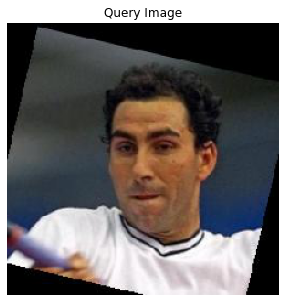

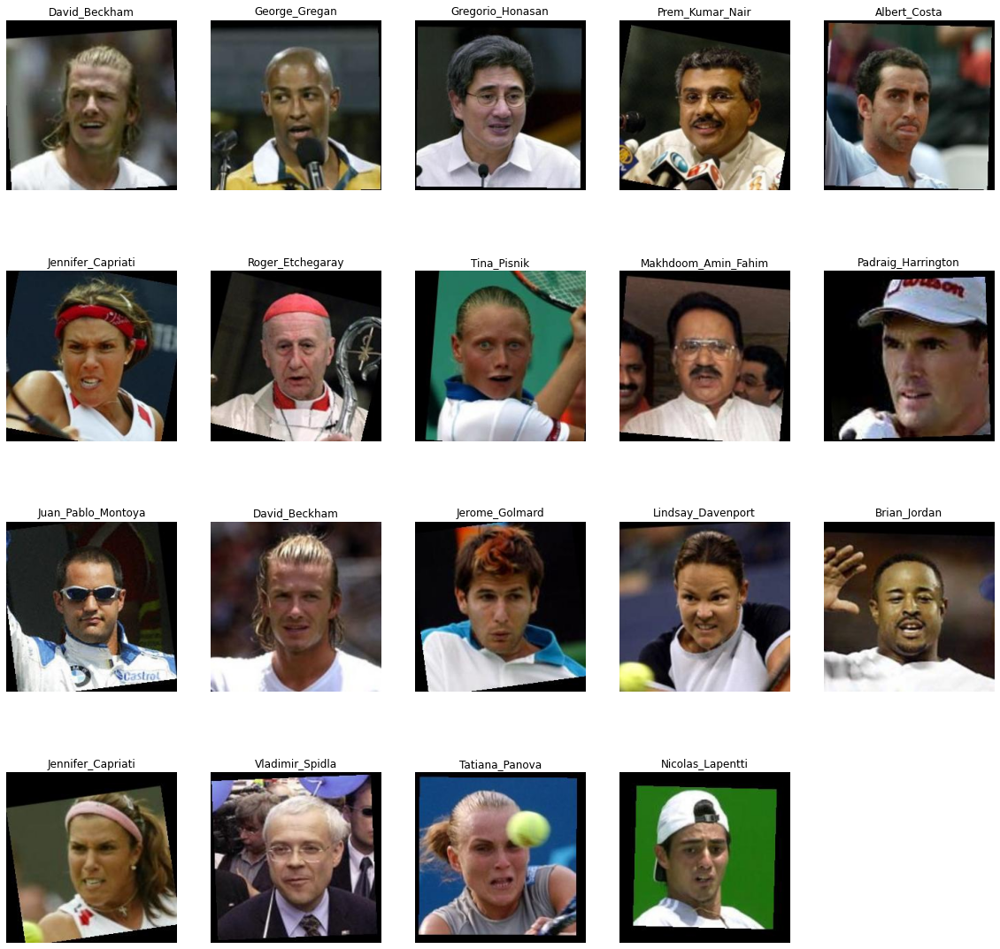

/content/drive/MyDrive/AI_Project/lfw-deepfunneled/Angela_Bassett/Angela_Bassett_0001.jpg is added.
(1, 8192)


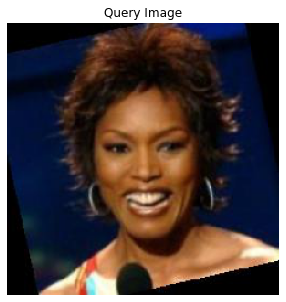

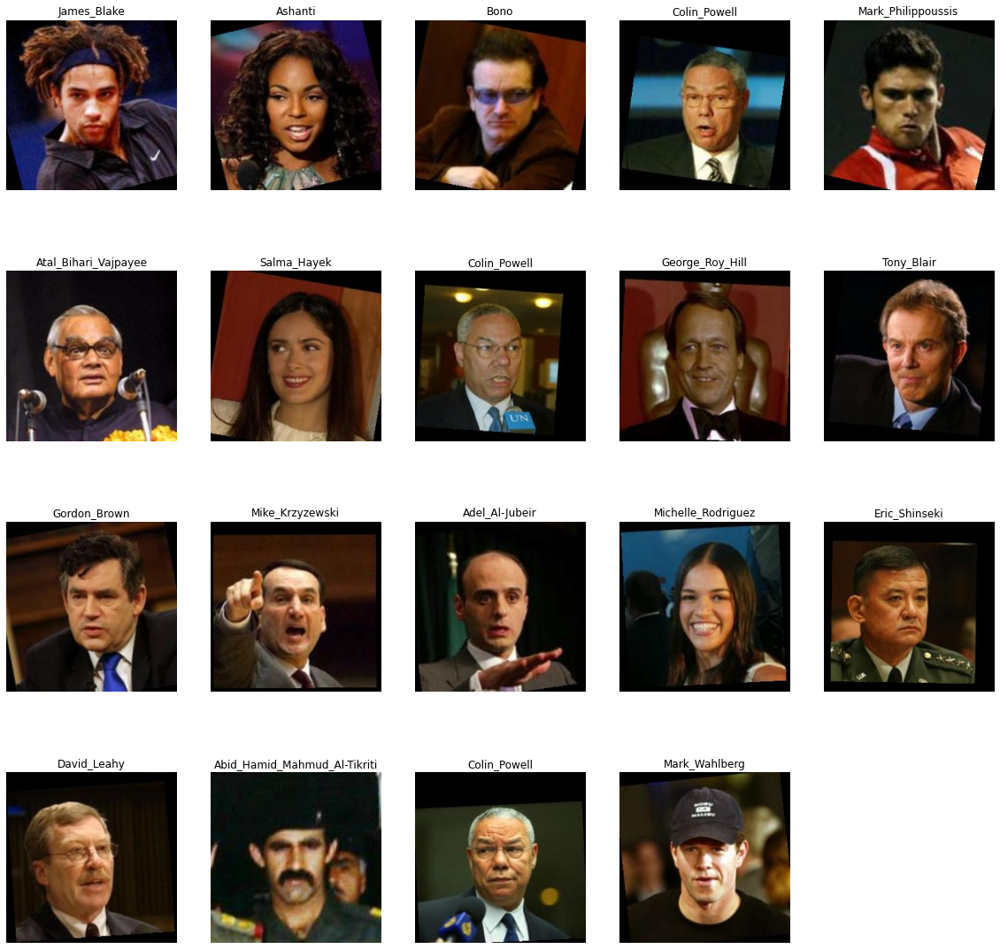

/content/drive/MyDrive/AI_Project/lfw-deepfunneled/Arminio_Fraga/Arminio_Fraga_0001.jpg is added.
(1, 8192)


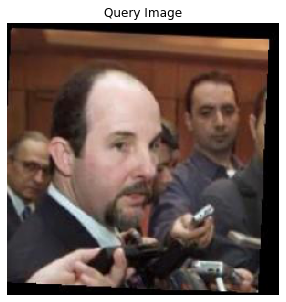

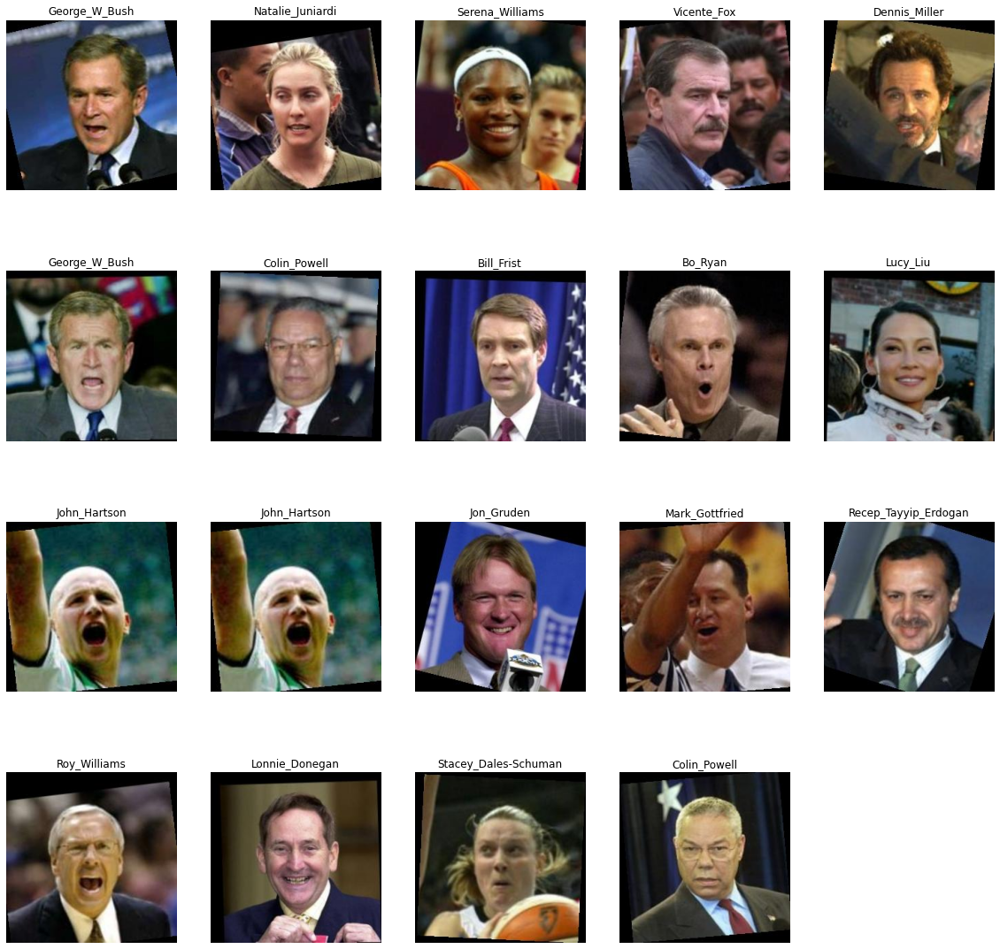

/content/drive/MyDrive/AI_Project/lfw-deepfunneled/Billy_Crystal/Billy_Crystal_0001.jpg is added.
(1, 8192)


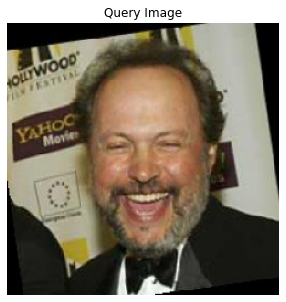

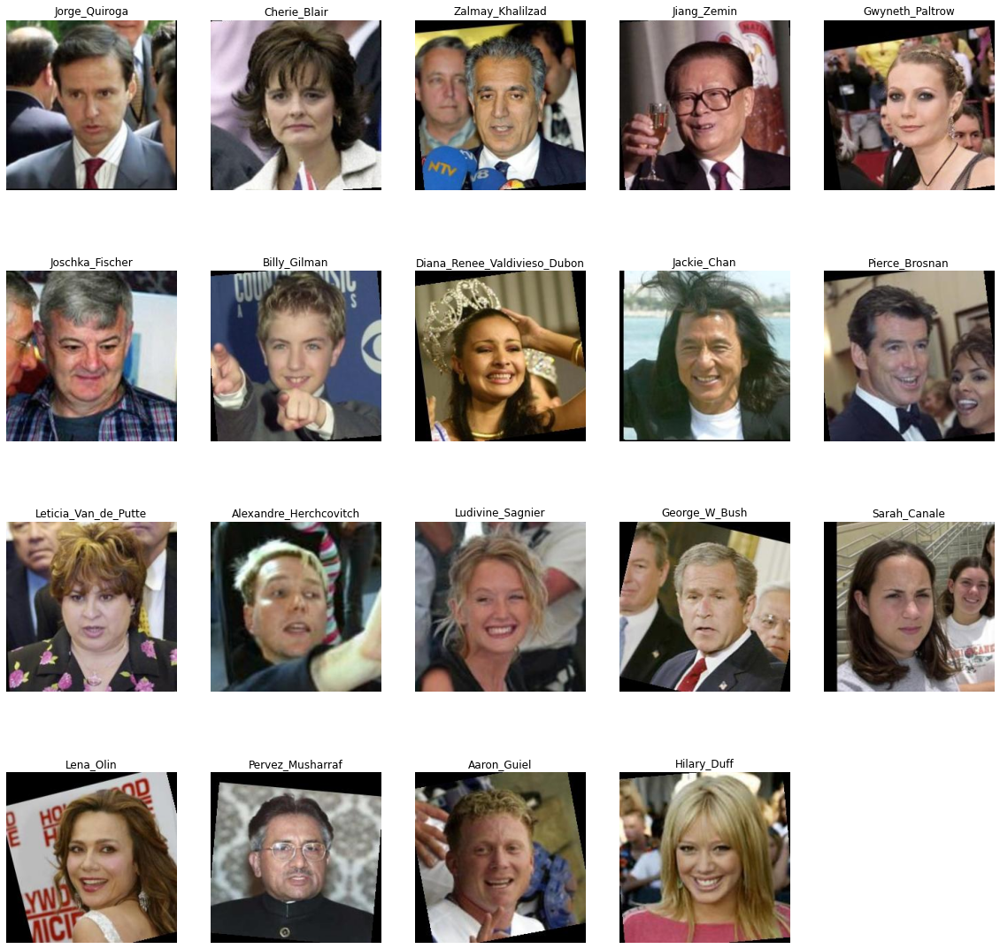

/content/drive/MyDrive/AI_Project/lfw-deepfunneled/Bob_Graham/Bob_Graham_0001.jpg is added.
(1, 8192)


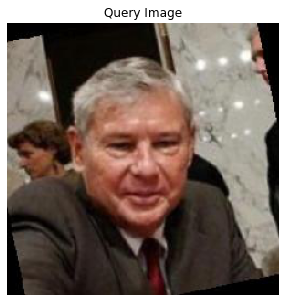

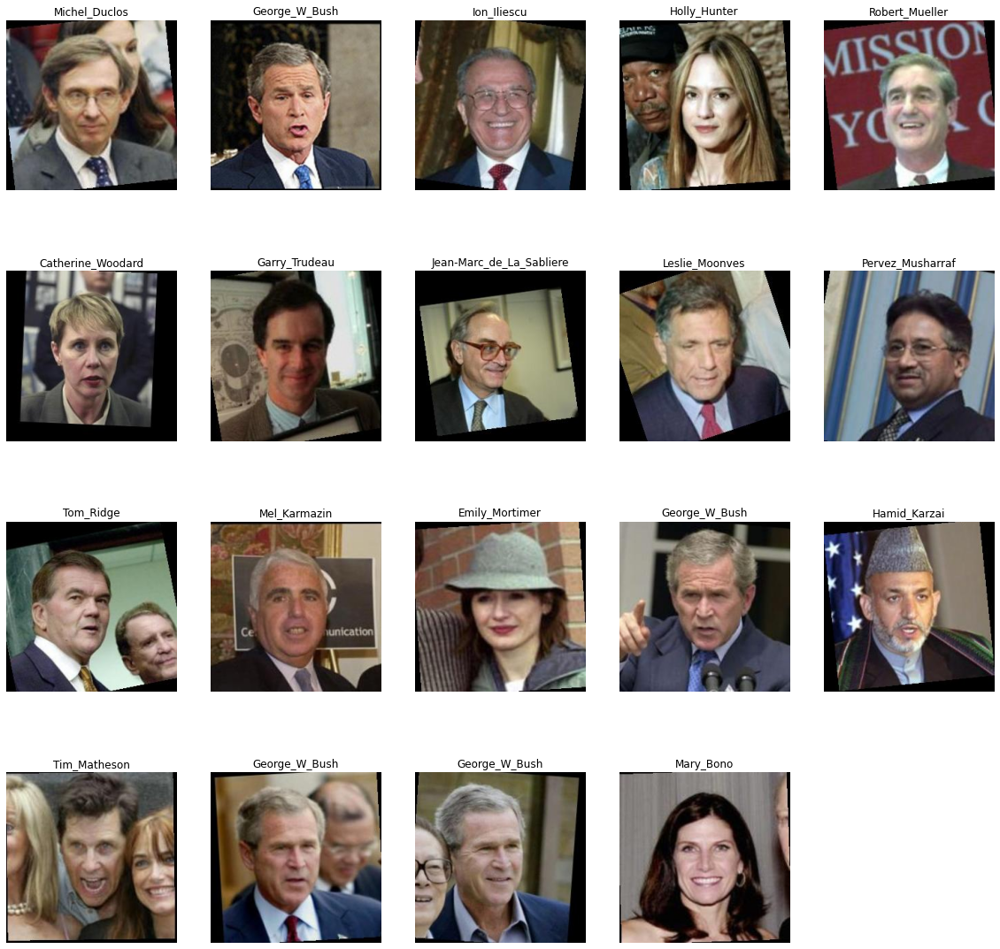

/content/drive/MyDrive/AI_Project/lfw-deepfunneled/Boris_Becker/Boris_Becker_0001.jpg is added.
(1, 8192)


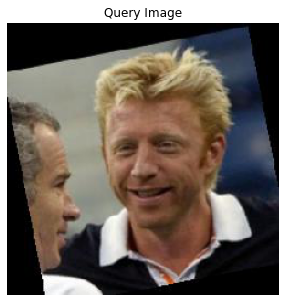

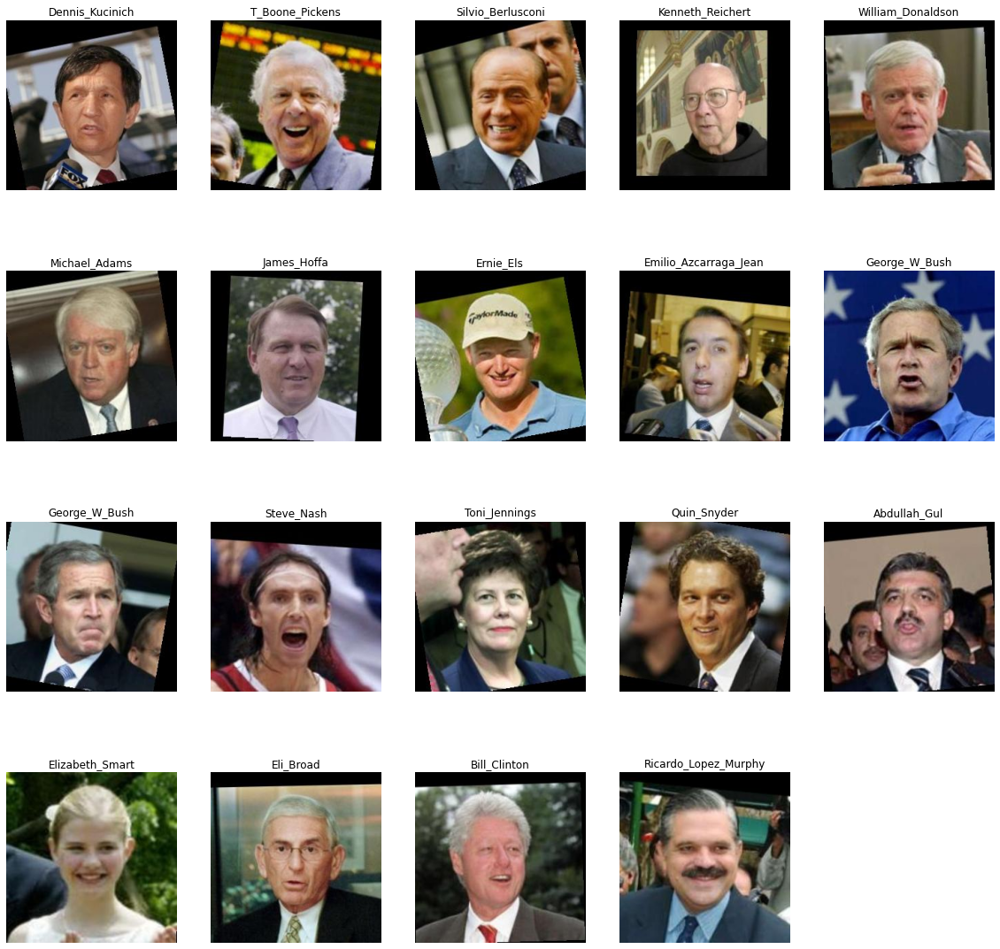

/content/drive/MyDrive/AI_Project/lfw-deepfunneled/Bulent_Ecevit/Bulent_Ecevit_0001.jpg is added.
(1, 8192)


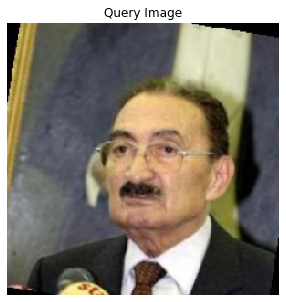

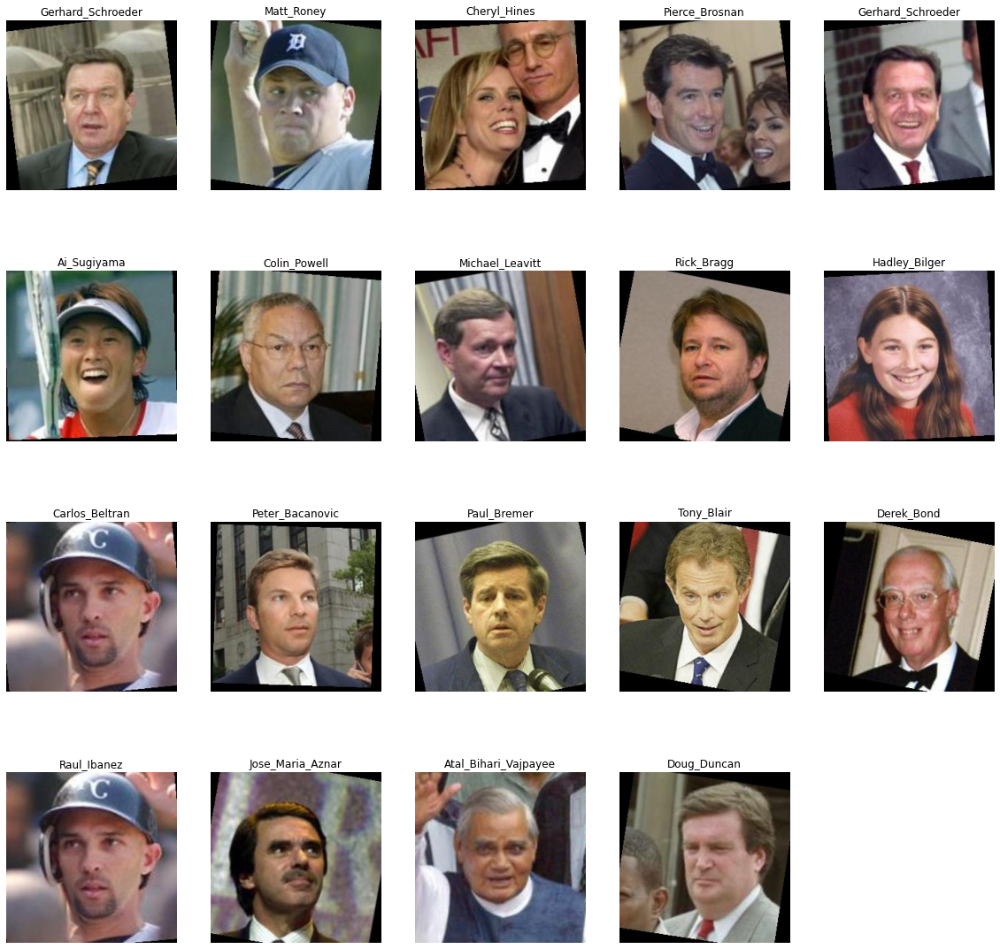

/content/drive/MyDrive/AI_Project/lfw-deepfunneled/Calista_Flockhart/Calista_Flockhart_0001.jpg is added.
(1, 8192)


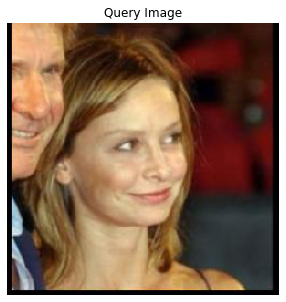

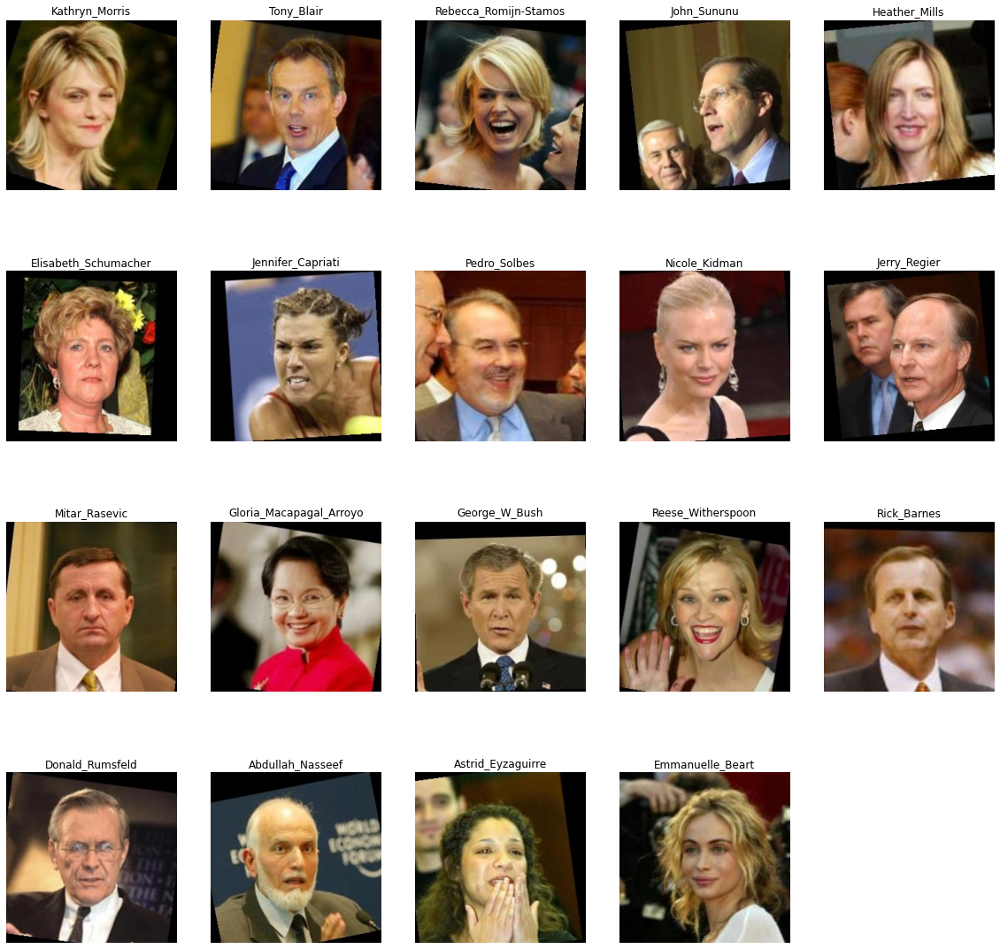

/content/drive/MyDrive/AI_Project/lfw-deepfunneled/Cameron_Diaz/Cameron_Diaz_0001.jpg is added.
(1, 8192)


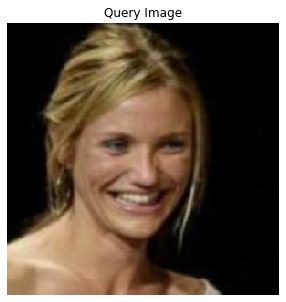

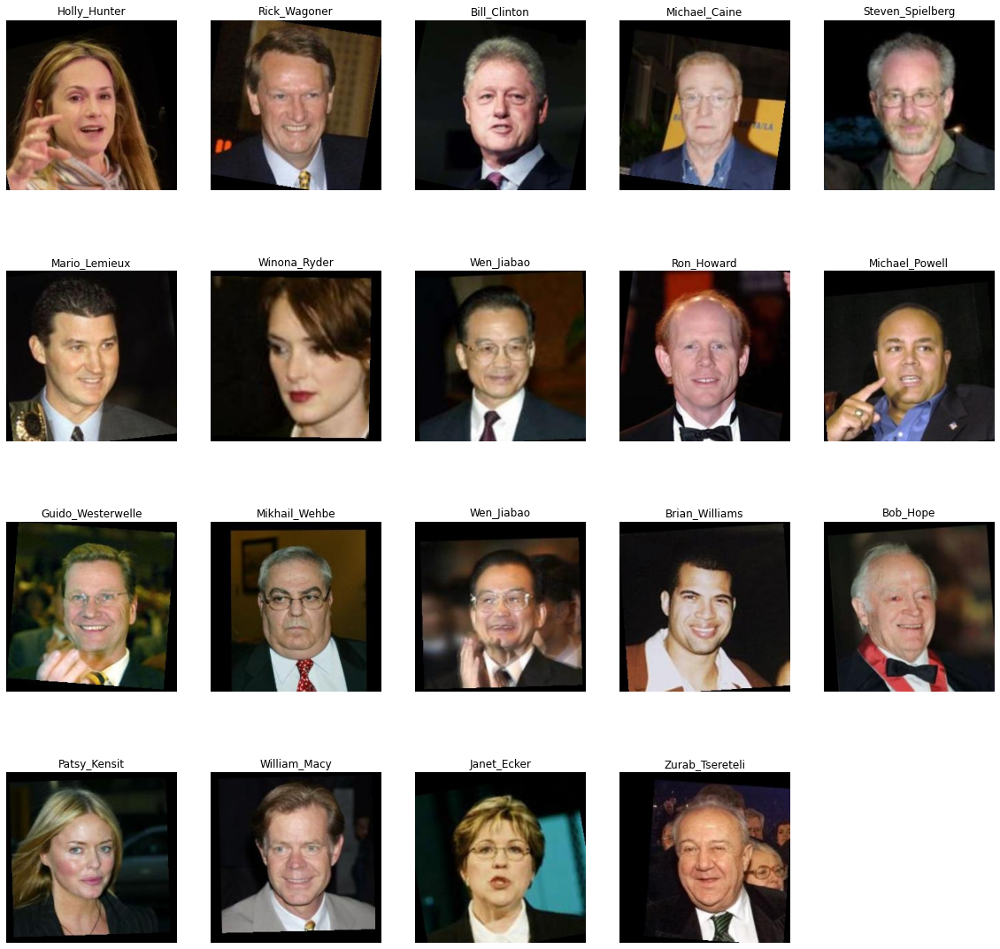

/content/drive/MyDrive/AI_Project/lfw-deepfunneled/Carmen_Electra/Carmen_Electra_0001.jpg is added.
(1, 8192)


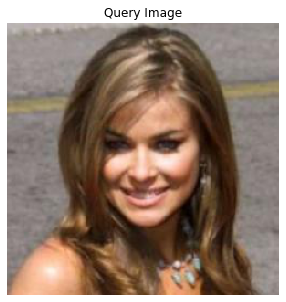

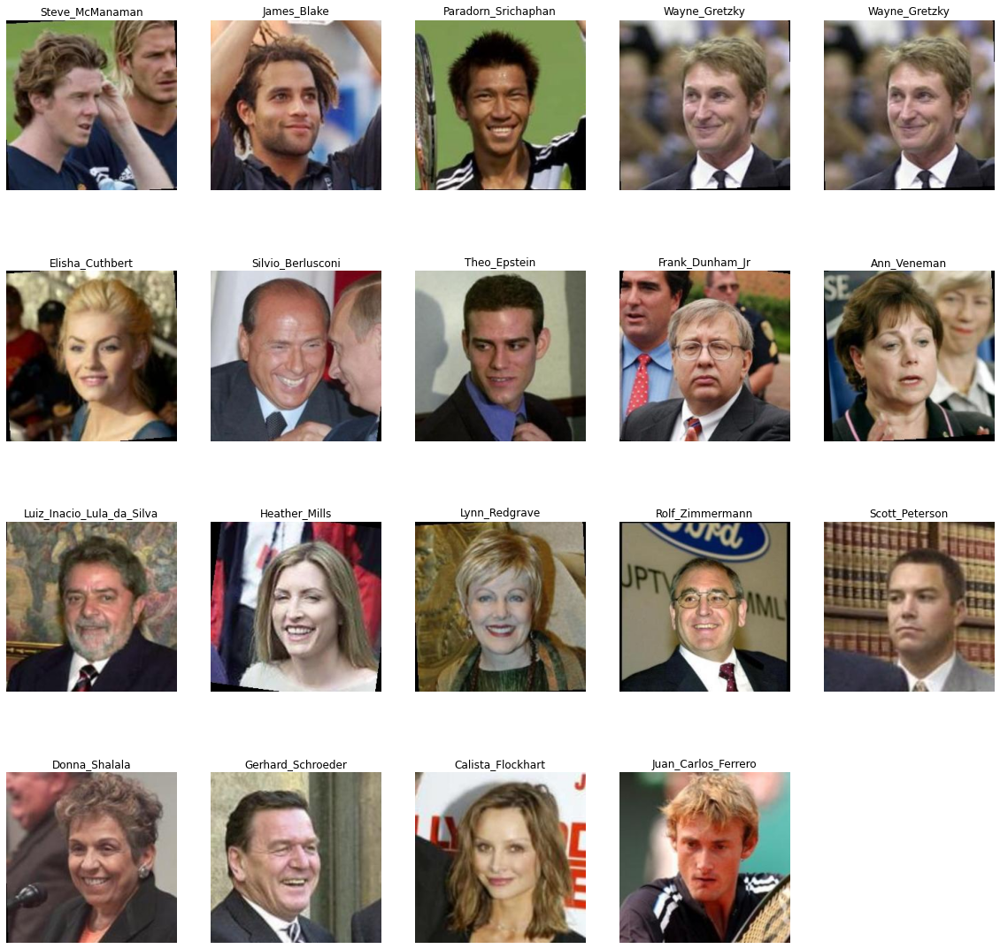

In [73]:
test_names = ['Albert_Costa', 
              'Angela_Bassett',
              'Arminio_Fraga', 
              'Billy_Crystal', 
              'Bob_Graham', 
              'Boris_Becker', 
              'Bulent_Ecevit', 
              'Calista_Flockhart', 
              'Cameron_Diaz', 
              'Carmen_Electra']


for name in test_names:
  filePath = os.path.join(lfwDir, str(name) + '/' + str(name) + '_0001.jpg')
  predictions(filePath,N = 20)